<a href="https://colab.research.google.com/github/mahapara2411/devopsgit/blob/main/Customer_Targeting_%26_Sales_Forecasting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
from math import ceil

from sklearn.cluster import KMeans
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.manifold import TSNE
import plotly
plotly.offline.init_notebook_mode(connected=True)

from ipywidgets import interact, interactive, fixed, interact_manual,VBox,HBox,Layout
import ipywidgets as widgets

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Retail_Dataset.xlsx to Retail_Dataset.xlsx


In [2]:
trans_df = pd.read_excel("Retail_cleaned_dataset.xlsx")

In [3]:
trans_df.head()

,Unnamed: 0,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,CustomerID,Country
0,0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01 07:45:00,6.95,13085,United Kingdom
1,1,489434,79323P,PINK CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085,United Kingdom
2,2,489434,79323W,WHITE CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085,United Kingdom
3,3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,2009-12-01 07:45:00,2.10,13085,United Kingdom
4,4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01 07:45:00,1.25,13085,United Kingdom


In [4]:
trans_df['InvoiceDate']=pd.to_datetime(trans_df['InvoiceDate'])
trans_df['Sales'] = trans_df.Quantity*trans_df.Price
trans_df['Year']=trans_df.InvoiceDate.dt.year
trans_df['Month']=trans_df.InvoiceDate.dt.month
trans_df['Week']=trans_df.InvoiceDate.dt.isocalendar().week
trans_df['Year_Month']=trans_df.InvoiceDate.dt.to_period('M')
trans_df['Hour']=trans_df.InvoiceDate.dt.hour
trans_df['Day']=trans_df.InvoiceDate.dt.day
#data['is_cancelled']=data.Invoice.apply(lambda x: 'Yes' if x[0]=='C' else 'No')
trans_df['weekday'] = trans_df.InvoiceDate.dt.day_name()
trans_df['Quarter'] = trans_df.Month.apply(lambda m:'Q'+str(ceil(m/4)))
trans_df['Date']=pd.to_datetime(trans_df[['Year','Month','Day']])
trans_df.head()

,Unnamed: 0,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,CustomerID,Country,Sales,Year,Month,Week,Year_Month,Hour,Day,weekday,Quarter,Date
0,0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01 07:45:00,6.95,13085,United Kingdom,83.4,2009,12,49,2009-12,7,1,Tuesday,Q3,2009-12-01
1,1,489434,79323P,PINK CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085,United Kingdom,81.0,2009,12,49,2009-12,7,1,Tuesday,Q3,2009-12-01
2,2,489434,79323W,WHITE CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085,United Kingdom,81.0,2009,12,49,2009-12,7,1,Tuesday,Q3,2009-12-01
3,3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,2009-12-01 07:45:00,2.10,13085,United Kingdom,100.8,2009,12,49,2009-12,7,1,Tuesday,Q3,2009-12-01
4,4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01 07:45:00,1.25,13085,United Kingdom,30.0,2009,12,49,2009-12,7,1,Tuesday,Q3,2009-12-01


**Distribution of Unit and Quantity**

There are negative numbers under quantity hence sales are also negative. Negative number can be return transactions. Ideally, I should align each return with respective sales transaction and cancel out the entry. But for now, I will remove negative quantity for our further analysis.

In [5]:
fig = make_subplots(rows=1, cols=3)

fig.add_trace(go.Box(y=trans_df.Price),row=1, col=1)
fig.add_trace(go.Box(y=trans_df.Quantity),row=1, col=2)
fig.add_trace(go.Box(y=trans_df.Sales),row=1, col=3)

fig.update_xaxes(title_text="Unit Price", row=1, col=1)
fig.update_xaxes(title_text="Quantity", row=1, col=2)
fig.update_xaxes(title_text="Sales", row=1, col=3)

fig.update_layout(height=500, width=700)
fig.show(renderer="colab")

**Geographical View**

In [6]:
df = px.data.gapminder()
df = df [['country','iso_alpha']]
data = pd.merge(trans_df,df[['country','iso_alpha']],left_on='Country',right_on='country',how='left').drop(columns=['country'])
del df

In [7]:
grp_data = data.groupby(by='Country')['Sales'].sum().sort_values(ascending=False).reset_index()

fig = go.Figure(data=go.Choropleth(
    locations = grp_data['Country'],
    z = grp_data['Sales'],
    text = grp_data['Country'],
    colorscale = 'earth',
    locationmode = 'country names',
    autocolorscale=False,
    reversescale=False,
    marker_line_color='darkgray',
    marker_line_width=0.5,
    colorbar_title = 'Sales',
))


fig.update_layout(
    title_text='Sales by country',
    geo=dict(showframe=False,showcoastlines=False,projection_type='equirectangular'),
    annotations = [dict(x=0.55,y=0.1,xref='paper',yref='paper',showarrow = False)])

fig.show(renderer="colab")

del grp_data

Lets delete negative quantity from the data and proceed with further analysis

**Ranking Trend**

Quarterly ranking all countries. This chart will show how quarterly ranking of each country is changing with respect sales.

Note: - I was looking for a way to connect each circle with line so that I could connect ranking circle of each country. This may help viewer to identify country and their ranking easily. Currently work is in progress for this section.

In [8]:
quarter_sales_country = trans_df.pivot_table(index='Country', columns='Quarter', values='Sales',aggfunc='sum').fillna(0)
rank_data = quarter_sales_country.apply(lambda x: x.rank(method='dense').astype(int)).reset_index()
rank_data['idx']=rank_data.index
rank_data = rank_data.melt(id_vars=['Country','idx'])

fig = px.scatter(rank_data , y="Country", x='Quarter', color="Country", hover_data=['Country']
                 ,size='value')
#fig.data[0].update(mode='markers+lines')
fig.update_layout(height=1500,width=700)
fig.show(renderer="colab")

del [rank_data,quarter_sales_country]

**Daily Trend**

Due to presence of anomaly in the data, we can see some spike in the trend. There is no more detail available so it will be difficult to anticipate that this spike is due to any events or promotion. For now, lets assume that it is a random event.

In [9]:
sales_by_date = trans_df.groupby(by='Date')['Sales'].sum().reset_index()
fig = go.Figure(data=go.Scatter(x=sales_by_date.Date,y=sales_by_date.Sales
                                ,line = dict(color='black', width=1.5)))
fig.update_layout(xaxis_title="Date",yaxis_title="Sales",title='Daily Sales',template='ggplot2')
fig.show(renderer="colab")

**Sales by Hours**

Hourly sales are normally distributed and with mean 709k.
There is no pattern in day wise sales in a month.
There is no business on Saturday.
Average sales are consistent from Monday to Friday
Sales starts at 6 in the morning and ends at 8 PM.
Peak hours of sales are between 10 AM to 3 PM
Monday and Tuesday Sales starts at 7 AM and close at 6 PM
Wednesday and Friday sales start at 7 AM and close at 8 PM
Business hours for Sunday is between 9 to 4 PM

In [10]:
sales_by_hour = trans_df.groupby(by='Hour')['Sales'].sum().reset_index()
sales_by_weekday = trans_df.groupby(by='weekday')['Sales'].sum().reset_index()

fig = make_subplots(rows=1, cols=2,subplot_titles=("Total Hourly Sales", "Total Sales by Weekday"))
fig.add_trace(go.Bar(y=sales_by_hour.Hour, x=sales_by_hour.Sales,orientation='h'),row=1, col=1)
fig.add_trace(go.Bar(x=sales_by_weekday.weekday, y=sales_by_weekday.Sales),row=1, col=2)
fig.update_layout(height=700, width=800,template='ggplot2')
fig.update_xaxes(title_text="Sales", row=1, col=1)
fig.update_xaxes(title_text="Weekday", row=1, col=2)
fig.update_yaxes(title_text="Hours", row=1, col=1)
fig.update_yaxes(title_text="Sales", row=1, col=2)
fig.show(renderer="colab")


del [sales_by_hour,sales_by_weekday]

In [11]:
customer_by_month1 = trans_df.groupby('CustomerID')['Date'].min().reset_index()
customer_by_month1['days'] = pd.TimedeltaIndex(customer_by_month1.Date.dt.day,unit="D")
customer_by_month1['Month'] = customer_by_month1.Date- customer_by_month1.days+pd.DateOffset(days=1)
customer_by_month1['Quarter_acquisition'] = customer_by_month1['Month'].dt.quarter.apply(lambda x:'Q'+str(x))
customer_by_month1['Year_acquisition'] = customer_by_month1['Month'].dt.year
customer_by_month = data.groupby(by = customer_by_month1.Month)['CustomerID'].size().reset_index()
customer_by_month.sort_values(by ='Month',ascending=True,inplace=True)
customer_by_month['cum_customer'] = np.cumsum(customer_by_month.CustomerID)
customer_by_month['Month_1'] = customer_by_month['Month'].dt.strftime('%b-%y')

**Customer Acquisition Over Time**

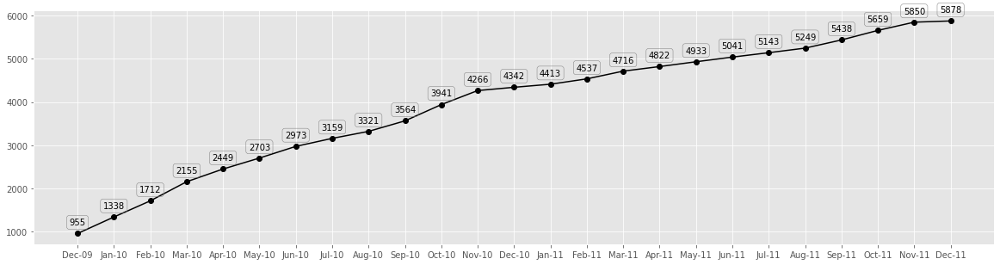

In [12]:
plt.style.use('ggplot')
plt.figure(figsize=(20,5))
plt.plot(customer_by_month.Month_1,customer_by_month.cum_customer,'bo-',color='black')

# zip joins x and y coordinates in pairs
for d,c in zip(customer_by_month['Month_1'],customer_by_month['cum_customer']):

    label = "{:.0f}".format(c)

    plt.annotate(label, 
                 (d,c), 
                 textcoords="offset points"
                 , bbox=dict(boxstyle="round", fc="none", ec="gray")
                 #,arrowprops=dict(arrowstyle="-",connectionstyle="angle,angleA=0,angleB=10,rad=90")
                 ,xytext=(0,10),
                 ha='center') 
plt.show()

del customer_by_month

Customer Acquisition vs Sales contribution

In [13]:
customer_sales = trans_df.groupby(by = ['CustomerID','Year','Quarter'])['Sales'].sum().reset_index()
customer_sales = customer_sales.merge(customer_by_month1[['CustomerID','Quarter_acquisition','Year_acquisition']]
                                      ,on ='CustomerID',how='inner')
customer_sales_acquisition = customer_sales.groupby(by=['Year','Quarter','Year_acquisition','Quarter_acquisition'])['Sales'].sum().reset_index()
customer_sales_acquisition['Sales_Year_quarter'] =customer_sales_acquisition[['Year','Quarter']].apply(lambda row:str(row.Year)+'-'+row.Quarter,axis=1)
customer_sales_acquisition['Acquisition_Year_quarter'] =customer_sales_acquisition[['Year_acquisition','Quarter_acquisition']].apply(lambda row:str(row.Year_acquisition)+'-'+row.Quarter_acquisition,axis=1)
customer_sales_acquisition.drop(columns =['Year','Quarter','Year_acquisition','Quarter_acquisition'],inplace=True)
df = customer_sales_acquisition.pivot(index='Sales_Year_quarter',columns =['Acquisition_Year_quarter']).fillna(0).reset_index()


fig = go.Figure(data=[
    go.Bar(name='First Order 2010-Q4', x=df.Sales_Year_quarter, y=df.iloc[:,1],marker_color='lightslategrey'),
    go.Bar(name='First Order 2011-Q1', x=df.Sales_Year_quarter, y=df.iloc[:,2],marker_color='lightblue'),
    go.Bar(name='First Order 2011-Q2', x=df.Sales_Year_quarter, y=df.iloc[:,3],marker_color='seagreen'),
    go.Bar(name='First Order 2011-Q3', x=df.Sales_Year_quarter, y=df.iloc[:,4],marker_color='orange')
])
fig.update_layout(barmode='stack',template='ggplot2')
fig.show(renderer="colab")

del [customer_sales_acquisition, df,customer_sales]

**Repeat Purchases**

In [14]:
cust_date =trans_df.loc[~trans_df.CustomerID.isna(),['CustomerID','Date']].drop_duplicates()
cust_date.sort_values(by=['CustomerID','Date'],inplace=True)
cust_date['rnk'] = cust_date.groupby(by='CustomerID')['Date'].transform('rank', method='dense')
cust_date = cust_date[cust_date.rnk<=2]
cust_date['Purchase'] = cust_date.rnk.map({1:'First Purchase',2:'Second Purchase'})

cust_purchase= cust_date.pivot(index='CustomerID',columns=['Purchase'],values='Date').reset_index()

cust_purchase['gap']=(cust_purchase['Second Purchase']- cust_purchase['First Purchase'])/ np.timedelta64(30, 'D')
cust_purchase['gap'] = cust_purchase['gap'].fillna(0).apply(lambda x:ceil(x))

days = pd.TimedeltaIndex(cust_purchase['First Purchase'].dt.day,unit="D")

cust_purchase['First_Purchase_month']=cust_purchase['First Purchase']- days+pd.DateOffset(days=1)
cust_purchase_grid = cust_purchase.pivot_table(index=['First_Purchase_month'],columns =['gap'],values='CustomerID',aggfunc='count').fillna(0)
cust_purchase_grid = cust_purchase_grid.sort_index( ascending=False)

fig = go.Figure(data=go.Heatmap(z=cust_purchase_grid
                                ,y=cust_purchase_grid.index,
                   x=cust_purchase_grid.columns.tolist(),
                   hoverongaps = True,colorscale='balance'))
fig.update_xaxes(side="top",showticklabels = True,ticktext= cust_purchase_grid.columns.tolist())
fig.update_layout(height=600,width=800,xaxis_title="Future Month of next Purchase after making first purchase"
                  ,yaxis_title="Month of 1st Purchase",
           yaxis=dict(autorange='reversed',showticklabels = True)
                  ,autosize=False,template='ggplot2')

fig.show(renderer="colab")

del [cust_date,cust_purchase,days,cust_purchase_grid]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



**Hypothetical Testing**

In [15]:
sales_by_hour = trans_df.groupby(by='Hour')['Sales'].mean().reset_index()
sales_by_weekday = trans_df.groupby(by='weekday')['Sales'].mean().reset_index()

fig = make_subplots(rows=1, cols=2,subplot_titles=("Avg Hourly Sales", "Avg Sales by Weekday"))
fig.add_trace(go.Bar(y=sales_by_hour.Hour, x=sales_by_hour.Sales,orientation='h'),row=1, col=1)
fig.add_trace(go.Bar(x=sales_by_weekday.weekday, y=sales_by_weekday.Sales),row=1, col=2)
fig.update_layout(height=700, width=800,template='ggplot2')
fig.update_xaxes(title_text="Sales", row=1, col=1)
fig.update_xaxes(title_text="Weekday", row=1, col=2)
fig.update_yaxes(title_text="Hours", row=1, col=1)
fig.update_yaxes(title_text="Sales", row=1, col=2)
fig.show(renderer="colab")

del [sales_by_hour,sales_by_weekday]

Hour

In [16]:
from statsmodels.formula.api import ols
import statsmodels.api as sm
model = ols('Sales ~ C(Hour)',data=data).fit()
#ols.summary()
table = sm.stats.anova_lm(model, typ=2)
print(table)
del [table,model]

                sum_sq         df           F  PR(>F)
C(Hour)   2.968219e+08       14.0  401.822407     0.0
Residual  4.817271e+11  9129928.0         NaN     NaN


Weekday

In [17]:
model = ols('Sales ~ C(weekday)',data=data).fit()
#moore_lm.summary()
table = sm.stats.anova_lm(model, typ=2)
print(table)

del [table,model]

                  sum_sq         df           F  PR(>F)
C(weekday)  1.538792e+08        6.0  485.921846     0.0
Residual    4.818700e+11  9129936.0         NaN     NaN


**LRFM**

In [18]:
LRFM = trans_df.groupby('CustomerID').agg(Frequency=pd.NamedAgg(column="Invoice", aggfunc="nunique")
                                        ,Monetary=pd.NamedAgg(column="Sales", aggfunc="sum")).reset_index()

length = trans_df.groupby('CustomerID')['Date'].max() - trans_df.groupby('CustomerID')['Date'].min()
length =  (length/np.timedelta64(1, 'D')).reset_index()
length.columns = ['CustomerID','Length_of_stay']
LRFM = LRFM.merge(length,on='CustomerID',how='inner')
del length

LRFM.head()

,CustomerID,Frequency,Monetary,Length_of_stay
0,12346,12,77556.46,400.0
1,12347,8,4921.53,402.0
2,12348,5,2019.40,363.0
3,12349,4,4428.69,571.0
4,12350,1,334.40,0.0


**3 D View of Sales vs Length of Stay vs Frequency**

In [19]:
fig = go.Figure(data=[go.Scatter3d(x=LRFM.Monetary,y=LRFM.Length_of_stay,z=LRFM.Frequency,mode='markers'
                                   ,marker=dict(size=4,color='coral',colorscale='Viridis',opacity=0.8))])
fig.update_layout(margin=dict(l=1, r=2, b=1, t=1)
                  ,scene=dict(xaxis=dict(title='Sales')
                              ,yaxis=dict(title='Lenght of Stay')
                              ,zaxis=dict(title='Frequency')),width=800,height=500)
fig.show(renderer="colab")

**Segmentation**

In [20]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.manifold import TSNE

In [21]:
X=LRFM.drop(columns = 'CustomerID')
error = []
silhouette = []
np.random.seed(12)
rng = range(2,20)
for i in rng:
    km = KMeans(n_clusters=i, init='random',n_init=20, max_iter=200,tol=.0001, random_state=12)
    km.fit(X)
    error.append(km.inertia_)
    lbls = km.fit_predict(X)
    silhouette.append(silhouette_score(X, lbls))

fig = make_subplots(rows=1, cols=2,subplot_titles=("Number of Cluster vs Error", "Number of Cluster vs Silhouette"))
fig.add_trace(go.Scatter(x=list(rng), y=error),row=1, col=1)
fig.add_trace(go.Scatter(x=list(rng), y=silhouette),row=1, col=2)
fig.update_layout(height=500, width=800,template='ggplot2')
fig.update_xaxes(title_text="Number of Clusters", row=1, col=1)
fig.update_xaxes(title_text="Number of Clusters", row=1, col=2)
fig.update_yaxes(title_text="Errors", row=1, col=1)
fig.update_yaxes(title_text="Silhouette Distance", row=1, col=2)
fig.show(renderer="colab")

del [error,silhouette,rng,km,lbls,X]

Create Clusters

In [22]:
X=LRFM.drop(columns = 'CustomerID')
cluster_lbls = KMeans(n_clusters=10, random_state=12).fit_predict(X)
X['cluster'] = cluster_lbls
X['sample_silhouette_values'] = silhouette_samples(X, cluster_lbls)
X['txt']=X.cluster.apply(lambda x:'Cluster '+str(x))

Silhoutee vs Sample

In [23]:
fig = go.Figure(data=go.Scatter(x=X.Monetary,y=X.sample_silhouette_values
                                , mode='markers',marker_color=X.cluster,text = X.txt))

fig.update_layout(xaxis_title="Sales",yaxis_title="Silhouette"
                  ,title='Sample Size vs Silhoutte Values')

fig.show(renderer="colab")

**Clustering Profile**

In [24]:
df = X.groupby('cluster').agg({'cluster':'size', 'Monetary':'mean','Frequency':'mean','Length_of_stay':'mean'}) \
       .rename(columns={'cluster':'Size','Monetary':'Avg Sales','Frequency':'Avg Recency','Length_of_stay':'Avg Lenght of Stay'}) \
       .reset_index().sort_values(by = 'Avg Sales')

cluster_map ={'Cluster 4':'lightskyblue','Cluster 0':'lightskyblue','Cluster 8':'lightskyblue'
              ,'Cluster 6':'lightskyblue','Cluster 2':'lightskyblue',
             'Cluster 3':'orange','Cluster 7':'orange','Cluster 9':'orange'
              ,'Cluster 1':'olive','Cluster 5':'olive'}

txt =['Size = {0:.0f}'.format(i) for i in df.Size]
df['cluster']=df.cluster.apply(lambda x:'Cluster '+str(x))
df['Group']=df.cluster.map(cluster_map)

fig = make_subplots(rows=1, cols=3,subplot_titles=("Avg Sales", "Avg Recency",'Avg Lenght of Stay'))

fig.add_trace(go.Bar(y=df.cluster, x=df['Avg Sales'],hovertext=txt
                        ,text=txt,textposition='auto',marker_color=df.Group,orientation='h'),row=1, col=1)
fig.add_trace(go.Bar(y=df.cluster, x=df['Avg Recency'],hovertext=txt
                        ,text=txt,textposition='auto',marker_color=df.Group,orientation='h'),row=1, col=2)
fig.add_trace(go.Bar(y=df.cluster, x=df['Avg Lenght of Stay'],hovertext=txt
                        ,text=txt,textposition='auto',marker_color=df.Group,orientation='h'),row=1, col=3)

fig.update_traces(marker_line_color='rgb(8,48,107)', marker_line_width=1.5, opacity=0.8)
fig.update_layout(title_text='Cluster Size',width = 800,height=600,template='ggplot2'
                  ,font=dict(family="Courier New, monospace",size=10,color="RebeccaPurple"))

fig.show(renderer="colab")

  3D View of Clusters

In [25]:
fig = go.Figure(data=[go.Scatter3d(x=X.Monetary,y=X.Length_of_stay,z=X.Frequency,mode='markers'
                                   ,marker=dict(size=4,color=X.cluster
                                                ,colorscale='Viridis',opacity=0.8))])

# tight layout
fig.update_layout(margin=dict(l=1, r=2, b=1, t=1)
                  ,scene=dict(xaxis=dict(title='Sales')
                              ,yaxis=dict(title='Lenght of Stay')
                              ,zaxis=dict(title='Recency')),width=700,height=500)
fig.show(renderer="colab")

Bivariate view of by Segment

In [26]:
fig = go.Figure(data=go.Scatter(x=X.Monetary,y=X.Length_of_stay
                                , mode='markers',marker_color=X.cluster,text=X.txt))
fig.update_layout(xaxis_title="Sales",yaxis_title="Length of Stay",title='Sales vs Length of Stay'
                  ,width=800,height=500)
fig.show(renderer="colab")

In [27]:
fig = go.Figure(data=go.Scatter(x=X.Monetary,y=X.Frequency
                                , mode='markers',marker_color=X.cluster,text=X.txt))
fig.update_layout(xaxis_title="Sales",yaxis_title="Frequency",title='Sales vs Frequency'
                  ,width=800,height=500)
fig.show(renderer="colab")

**t-distributed Stochastic Neighbor Embedding**

In [28]:
prpxlt = [10,15,30,40]
fig = make_subplots(rows=2, cols=2,subplot_titles=['perplexity = %s'%i for i in prpxlt])

for i, prpxlt_ in enumerate(prpxlt):
    X_tsne = TSNE(n_components=2, init='random',
                         random_state=0, perplexity=prpxlt_).fit_transform(X[['Frequency', 'Monetary', 'Length_of_stay']])
    if i%2==0:
        c=2
    else:
        c=1
    r = (i)//2+1
    fig.add_trace(go.Scatter(x=X_tsne[:,0],y=X_tsne[:,1]
                                    , mode='markers',marker=dict(size=4,color=X.cluster
                                                ,colorscale='Viridis',opacity=0.8),text=X.txt),row=r, col=c)

    fig.update_xaxes(title_text="Component 1", row=r, col=c)
    fig.update_yaxes(title_text="Component 2", row=r, col=c)
    
fig.update_layout(height=600, width=800)
fig.show(renderer="colab")

del [X_tsne,fig]

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



Time series forecasting

In [29]:
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_pacf,plot_acf

In [30]:
ds_weekly = trans_df.groupby(by=['Year','Week'])['Sales'].sum().reset_index()
ds_daily = trans_df.groupby(by=['Date'])['Sales'].sum().reset_index()

In [31]:
def plot_(t_train,t_test,x_train,x_test,x_train_pred,x_test_pred,forecast,title='Weekly'):
    xt = (max(t_test)+np.arange(len(forecast)))+1
    fig_train=go.Scatter(name='Train : Actual ',x=t_train,y=x_train,showlegend=True)
    fig_trian_pred=go.Scatter(name='Train : Predict',x=t_train,y=x_train_pred,showlegend=True)
    fig_test=go.Scatter(name='Test : Actual',x=t_test,y=x_test,showlegend=True)
    fig_test_pred=go.Scatter(name='Test : Predict',x=t_test,y=x_test_pred,showlegend=True)
    fig_forecast=go.Scatter(name='Forecast',x=xt,y=forecast,showlegend=True)

    fig = go.Figure([fig_train,fig_trian_pred,fig_test,fig_test_pred,fig_forecast])
    fig.update_layout(xaxis_title=title,yaxis_title="Sales",title=title +' Trend'
                      ,height=400,hovermode="x",template='ggplot2')
    fig.show(renderer="colab")

Weekly:Trend

In [32]:
fig = go.Figure(data=[go.Scatter(x=ds_weekly.index,y=ds_weekly.Sales)])
fig.update_layout(xaxis_title="Week",yaxis_title="Sales",title='Weekly Trend',height=400,template='ggplot2')
fig.show(renderer="colab")

Weekly: Test of Stationarity of Actual Series

In [33]:
output = adfuller(ds_weekly.Sales)
print('***************************Week*********************************')
print('ADF Statistic: {0:.2f} and P value:{1:.5f}'.format(*output))
print("As we can see the p value is extreemly high which indicates that we are fail to reject null hypothesis " \
      "and can conclude that series is not stationary ")

***************************Week*********************************
ADF Statistic: -2.32 and P value:0.16584
As we can see the p value is extreemly high which indicates that we are fail to reject null hypothesis and can conclude that series is not stationary 


Weekly: Test of Stationarity with 1 differencing of series

In [34]:
d=1
print('***************************Week*********************************')
# series = ds.Sales
series = ds_weekly.Sales.diff(d)# - ds.Sales.rolling(window=12).mean()
series = series.dropna()
output = adfuller(series)

print('ADF Statistic: {0:.2f} and P value:{1:.5f}'.format(*output))
print("As we can see the p value is close to zero which is less than .05 hence we reject null hypothesis and conclude " \
      " that series is stationary with rolling mean difference at lag of 12 ")

***************************Week*********************************
ADF Statistic: -8.65 and P value:0.00000
As we can see the p value is close to zero which is less than .05 hence we reject null hypothesis and conclude  that series is stationary with rolling mean difference at lag of 12 


Weekly: PACF & ACF

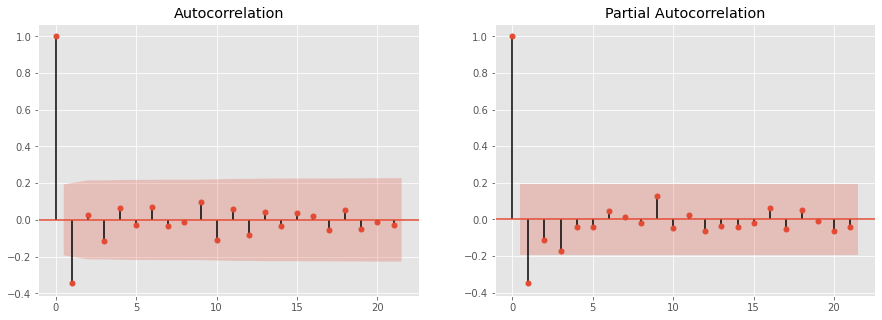

In [35]:
fig, ax = plt.subplots(1,2,figsize=(15,5))
plot_acf(series, ax=ax[0])
plot_pacf(series, ax=ax[1])
plt.show()

**Weekly: Train & Test Split**

In [36]:
series=ds_weekly.Sales
split_time = 45
time=np.arange(len(ds_weekly))
xtrain=series[:split_time]
xtest=series[split_time:]
timeTrain = time[:split_time]
timeTest = time[split_time:]
print('Full Set Size ',series.shape)
print('Training Set Size ',xtrain.shape)
print('Testing Set Size ',xtest.shape)

Full Set Size  (104,)
Training Set Size  (45,)
Testing Set Size  (59,)


In [37]:
!pip install statsmodels==0.12.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [38]:
import statsmodels.api as sm

In [39]:
!pip3 install --user scipy==1.2.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [40]:
from statsmodels.tsa.arima.model import ARIMA
model = ARIMA(xtrain, order=(1,1,2))
model_fit = model.fit()
print(model_fit.summary())

                               SARIMAX Results                                
Dep. Variable:                  Sales   No. Observations:                   45
Model:                 ARIMA(1, 1, 2)   Log Likelihood                -534.110
Date:                Mon, 25 Jul 2022   AIC                           1076.220
Time:                        17:30:51   BIC                           1083.356
Sample:                             0   HQIC                          1078.866
                                 - 45                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3376      1.770      0.191      0.849      -3.131       3.806
ma.L1         -0.8562      1.827     -0.469      0.639      -4.438       2.725
ma.L2          0.0899      1.018      0.088      0.9

In [41]:
ytrain_pred = model_fit.predict()
ytest_pred = model_fit.predict(start=min(timeTest),end=max(timeTest),dynamic=True)
print('MSE Train :',np.sqrt(np.mean((ytrain_pred - xtrain)**2)))
print('MSE Test :',np.sqrt(np.mean((ytest_pred - xtest)**2)))
forecast = model_fit.forecast(20, alpha=0.05)
plot_(t_train = timeTrain,t_test = timeTest,x_train = xtrain,x_test = xtest,x_train_pred = ytrain_pred
      ,x_test_pred = ytest_pred,forecast = forecast,title='Weekly')

MSE Train : 55966.27371005837
MSE Test : 94470.41835760944


In [42]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
s_model = SARIMAX(endog=xtrain , order=(1, 1, 2), seasonal_order=(1, 1, 1, 3), trend='c')
s_model_fit=s_model.fit()
print(s_model_fit.summary())

                                      SARIMAX Results                                      
Dep. Variable:                               Sales   No. Observations:                   45
Model:             SARIMAX(1, 1, 2)x(1, 1, [1], 3)   Log Likelihood                -493.486
Date:                             Mon, 25 Jul 2022   AIC                           1000.972
Time:                                     17:30:51   BIC                           1012.967
Sample:                                          0   HQIC                          1005.340
                                              - 45                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   7046.1533   9149.466      0.770      0.441   -1.09e+04     2.5e+04
ar.L1         -0.9843      

In [43]:
ytrain_pred = s_model_fit.predict()
ytest_pred = s_model_fit.predict(start=min(timeTest),end=max(timeTest),dynamic=True)
print('RMSE Train :',np.sqrt(np.mean((ytrain_pred - xtrain)**2)))
print('RMSE Test :',np.sqrt(np.mean((ytest_pred - xtest)**2)))
forecast = s_model_fit.forecast(20, alpha=0.05)
plot_(t_train = timeTrain,t_test = timeTest,x_train = xtrain,x_test = xtest,x_train_pred = ytrain_pred
      ,x_test_pred = ytest_pred,forecast = forecast,title='Weekly')

RMSE Train : 69817.64258513684
RMSE Test : 1839519.600646093


Daily Trend

In [44]:
fig = go.Figure(data=[go.Scatter(x=ds_daily.Date,y=ds_daily.Sales)])
fig.update_layout(xaxis_title="Date",yaxis_title="Sales",title='Daily Trend',height=400,template='ggplot2')
fig.show(renderer="colab")

Daily: Test of Stationarity of Actual Series

In [45]:
print('\n***************************Daily*********************************')
output = adfuller(ds_daily.Sales)
print('ADF Statistic: {0:.2f} and P value:{1:.5f}'.format(*output))
print("As we can see the p value is extreemly high which indicates that we are fail to reject null hypothesis " \
      "and can conclude that series is not stationary ")


***************************Daily*********************************
ADF Statistic: -1.65 and P value:0.45640
As we can see the p value is extreemly high which indicates that we are fail to reject null hypothesis and can conclude that series is not stationary 


Daily: Test of Stationarity with 1 differencing of series

In [46]:
print('\n***************************Daily*********************************')
series_date = ds_daily.Sales.diff(d)
series_date = series_date.dropna()
output = adfuller(series_date)
print('ADF Statistic: {0:.2f} and P value:{1:.5f}'.format(*output))
print("As we can see the p value is close to zero which is less than .05 hence we reject null hypothesis and conclude " \
      " that series is stationary with rolling mean difference at lag of 12 ")


***************************Daily*********************************
ADF Statistic: -9.53 and P value:0.00000
As we can see the p value is close to zero which is less than .05 hence we reject null hypothesis and conclude  that series is stationary with rolling mean difference at lag of 12 


Daily: PACF & ACF

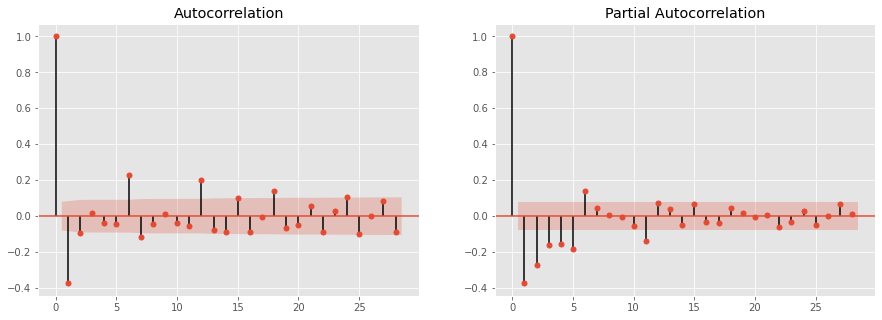

In [47]:
fig, ax = plt.subplots(1,2,figsize=(15,5))
plot_acf(series_date, ax=ax[0])
plot_pacf(series_date, ax=ax[1])
plt.show()

Daily: Train & Test Split

In [48]:
series_date=ds_daily.Sales
split_time = 250
time_d=np.arange(len(ds_daily))
xtrain_d=series_date[:split_time]
xtest_d=series_date[split_time:]
timeTrain_d = time_d[:split_time]
timeTest_d = time_d[split_time:]
print('Full Set Size ',series_date.shape)
print('Training Set Size ',xtrain_d.shape)
print('Testing Set Size ',xtest_d.shape)

Full Set Size  (604,)
Training Set Size  (250,)
Testing Set Size  (354,)


Daily: ARIMA model

In [49]:
s_model = ARIMA(endog=xtrain_d , order=(1, 1, 1))
s_model_fit=s_model.fit()
print(s_model_fit.summary())

                               SARIMAX Results                                
Dep. Variable:                  Sales   No. Observations:                  250
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -2681.897
Date:                Mon, 25 Jul 2022   AIC                           5369.794
Time:                        17:30:52   BIC                           5380.347
Sample:                             0   HQIC                          5374.042
                                - 250                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1557      0.072      2.158      0.031       0.014       0.297
ma.L1         -0.9246      0.025    -37.295      0.000      -0.973      -0.876
sigma2      1.443e+08   5.04e-10   2.86e+17      0.0

In [50]:
s_model = ARIMA(endog=xtrain_d , order=(1, 1, 1))
s_model_fit=s_model.fit()
print(s_model_fit.summary())

                               SARIMAX Results                                
Dep. Variable:                  Sales   No. Observations:                  250
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -2681.897
Date:                Mon, 25 Jul 2022   AIC                           5369.794
Time:                        17:30:52   BIC                           5380.347
Sample:                             0   HQIC                          5374.042
                                - 250                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1557      0.072      2.158      0.031       0.014       0.297
ma.L1         -0.9246      0.025    -37.295      0.000      -0.973      -0.876
sigma2      1.443e+08   5.04e-10   2.86e+17      0.0

Daily: SARIMAX Model

In [51]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
s_model = SARIMAX(endog=xtrain_d , order=(1, 1, 1), seasonal_order=(1, 1, 2, 12), trend='t')
s_model_fit=s_model.fit()
print(s_model_fit.summary())

                                        SARIMAX Results                                        
Dep. Variable:                                   Sales   No. Observations:                  250
Model:             SARIMAX(1, 1, 1)x(1, 1, [1, 2], 12)   Log Likelihood               -2567.733
Date:                                 Mon, 25 Jul 2022   AIC                           5149.465
Time:                                         17:30:56   BIC                           5173.741
Sample:                                              0   HQIC                          5159.250
                                                 - 250                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
drift          0.0819      0.319      0.257      0.797      -0.543       0

In [52]:
ytrain_pred = s_model_fit.predict()
ytest_pred = s_model_fit.predict(start=min(timeTest_d),end=max(timeTest_d),dynamic=True)

print('MSE Train :',np.sqrt(np.mean((ytrain_pred - xtrain_d)**2)))
print('MSE Test :',np.sqrt(np.mean((ytest_pred - xtest_d)**2)))
forecast = s_model_fit.forecast(30, alpha=0.05)
xt = max(timeTest_d)+np.arange(len(forecast))

plot_(t_train = timeTrain_d,t_test = timeTest_d,x_train = xtrain_d,x_test = xtest_d,x_train_pred = ytrain_pred
      ,x_test_pred = ytest_pred,forecast = forecast,title='Daily')

MSE Train : 12662.268314951009
MSE Test : 214404.07636276266


Regression Analysis on LRFM Data

A linear regression model based on features such as frequency and length of stay of customers which will predict Sales generated by customers.

In [53]:
from sklearn.linear_model import LinearRegression
import scipy.stats as stats
from sklearn.model_selection import train_test_split
from statsmodels.stats.stattools import durbin_watson
import statsmodels.api as sm
from statsmodels.stats.diagnostic import linear_rainbow
from statsmodels.stats.api import het_goldfeldquandt
from sklearn.metrics import r2_score

Splitting the data

In [54]:
xtrain1,xtest1,ytrain1,ytest1 = train_test_split(LRFM[['Frequency', 'Length_of_stay']],LRFM.Monetary
                                             ,test_size=.3,random_state=49,shuffle=True)
print(xtrain1.shape)
print(xtest1.shape)

(4114, 2)
(1764, 2)


Log-Log Model

In [55]:
from sklearn.preprocessing import PolynomialFeatures

In [56]:
# poly = PolynomialFeatures(2)
# xtest = poly.fit_transform(xtest1)
# xtrain = poly.fit_transform(xtrain1)

inp_test=sm.add_constant(np.log1p(xtest1))
inp_train=sm.add_constant(np.log1p(xtrain1))
ytrain=np.log1p(ytrain1)
ytest=np.log1p(ytest1)
ols=sm.OLS(ytrain,inp_train)
model=ols.fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:               Monetary   R-squared:                       0.731
Model:                            OLS   Adj. R-squared:                  0.731
Method:                 Least Squares   F-statistic:                     5585.
Date:                Mon, 25 Jul 2022   Prob (F-statistic):               0.00
Time:                        17:30:56   Log-Likelihood:                -4486.3
No. Observations:                4114   AIC:                             8979.
Df Residuals:                    4111   BIC:                             8998.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              4.5308      0.024    186.

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:142: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only



Interpration

In [57]:
print('Below are the interprataion of all 2 coeficients')
print('if customers increase the frequency of purchase by 1 percent then we can expect that sales will increase by 1.3%')
print('As customers are staying long with business then we can expect that sales will increase by 0.05%')

Below are the interprataion of all 2 coeficients
if customers increase the frequency of purchase by 1 percent then we can expect that sales will increase by 1.3%
As customers are staying long with business then we can expect that sales will increase by 0.05%


Get Error

In [58]:
ytrain_pred=model.predict(inp_train)
ytest_pred=model.predict(inp_test)

train_res=ytrain-ytrain_pred
test_res=ytest-ytest_pred

train_mse= np.mean(train_res**2)
test_mse= np.mean(test_res**2)

print('Train MSE:{0:.4f}'.format(train_mse))
print('Test MSE:{0:.4f}'.format(test_mse))

Train MSE:0.5185
Test MSE:0.5267


Get R square

In [59]:
r2_train=r2_score(ytrain,ytrain_pred)
r2_test=r2_score(ytest,ytest_pred)
print('R square Train:{0:.4f}'.format(r2_train))
print('R square Test:{0:.4f}'.format(r2_test))

R square Train:0.7310
R square Test:0.7221


Linearrainbow test

H0 : Part of the data is Linear

Ha : Independent features does not have linear relation with target feature

In [60]:
pval=linear_rainbow(res=model,frac=0.5)[1]
print('P value {0:.2f}'.format(pval))

P value 0.99


Homoscadastic -- Uniform variance
H0 : model is Homoscadastic

Ha : model is Heteroskedastic

In [61]:
homoscad = het_goldfeldquandt(train_res,inp_train)[1]
print('P Value {0:.2f}'.format(homoscad))

P Value 0.77


Plot between Actual and predicted to check relationship

In [62]:
fig = make_subplots(rows=1, cols=2,subplot_titles=['Train','Test'])
fig.add_trace(go.Scatter(x=ytrain,y=ytrain_pred, mode='markers'
                         ,marker=dict(size=4,colorscale='Viridis',opacity=0.8)),row=1, col=1)
fig.add_trace(go.Scatter(x=ytest,y=ytest_pred, mode='markers'
                         ,marker=dict(size=4,colorscale='Viridis',opacity=0.8)),row=1, col=2)
fig.update_xaxes(title_text="Actual", row=1, col=1)
fig.update_yaxes(title_text="Predicted", row=1, col=1)
fig.update_xaxes(title_text="Actual", row=1, col=2)
fig.update_yaxes(title_text="Predicted", row=1, col=2)
fig.update_layout(height=400, width=800,template='ggplot2')
fig.show(renderer="colab")

Test of Assumptions of Regression
To meet all assumptions of linear regression below are the criteria must be followed

Normality - Error Must be normally distributed

To test this assumption, we can run statistical tests or simply can take skewness of residual and can accept it as normally distributed if skewness is -.5 to +.5
Independence - Residual must not be autocorrelated

To test this assumption, we can check Durbin Watson value
if it is = 2, then there is no autocorrelation among residual points.
if it is 0< Durbin Watson <2 then there is Positive autocorrelation
if it is 2< Durbin Watson <4. Negative auto correlation
For standard practice Durbin Watson value between 1.5 and 2.5 is acceptable range to pass this test
Homoscedasticity - There should be uniform variance in error with respect target variable
Linearity -The relationship between X and the mean of Y is linear.

In [63]:
textstr = "<br>".join(("SKEW={:.2f}".format(train_res.skew())
                     ,'Linearity Test P value={:.2f}'.format(pval)
                    ,'Homoscadastic Test P value={:.2f}'.format(homoscad)
                    ,'Durbin Watson value = {:.2f}'.format(durbin_watson(train_res))
                    ,'Train MSE ={:.3f}'.format(train_mse)
                    ,'Test MSE ={:.3f}'.format(test_mse)
                    ,'R square Train ={:.3f}'.format(r2_train)
                    ,'R square Test ={:.3f}'.format(r2_test)))

fig= px.scatter(x=ytrain,y=train_res,marginal_y="histogram",
               marginal_x="histogram", trendline="ols")

fig.update_layout(title="Test of Assumptions",xaxis_title="Predicted",yaxis_title="Residual",
                            font=dict(family="Courier New, monospace",size=10,color="RebeccaPurple"))

fig.add_annotation(x=4,y=4,xref="x",yref="y",text=textstr,showarrow=False,font=dict(size=10)
                   ,align="left",ax=20,ay=-30,bordercolor="#c7c7c7",borderwidth=2,borderpad=4,bgcolor="snow",opacity=0.8)
fig.show(renderer="colab")